<div style="background-color:#F3C3B2; padding:4px; border-radius:10px">
    <h2 style="color:#1b0034; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
       🏘️ House Sales Regression 🏘️
    </h2>
</div>

In [ ]:
# Core data manipulation
import pandas as pd
import numpy as np
import math

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap
from folium import Popup, Marker

# Statistical analysis and outlier detection
from scipy.stats import zscore
from scipy import stats

# Data preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Machine learning models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score

# Model training and evaluation
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.pipeline import Pipeline

In [2]:
df = pd.read_csv(r'C:\Users\hadee\Desktop\Data Scientist\Project_Final\kc_house_data.csv')

<div style="background-color:#99CDD8; padding:10px; border-radius:10px">
    <h1 style="color:#1b0034; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
       🧹 Exploratory Data Analysis (EDA) 🧹
    </h1>
</div>

In [3]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df.shape

(21613, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [6]:
df['date'] = pd.to_datetime(df['date'], format='%Y%m%dT%H%M%S')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

In [8]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
id,21613.0,4580301520.864988,1000102.0,2123049194.0,3904930410.0,7308900445.0,9900000190.0,2876565571.312057
date,21613,2014-10-29 04:38:01.959931648,2014-05-02 00:00:00,2014-07-22 00:00:00,2014-10-16 00:00:00,2015-02-17 00:00:00,2015-05-27 00:00:00,NaN
price,21613.0,540088.141767,75000.0,321950.0,450000.0,645000.0,7700000.0,367127.196483
bedrooms,21613.0,3.370842,0.0,3.0,3.0,4.0,33.0,0.930062
bathrooms,21613.0,2.114757,0.0,1.75,2.25,2.5,8.0,0.770163
sqft_living,21613.0,2079.899736,290.0,1427.0,1910.0,2550.0,13540.0,918.440897
sqft_lot,21613.0,15106.967566,520.0,5040.0,7618.0,10688.0,1651359.0,41420.511515
floors,21613.0,1.494309,1.0,1.0,1.5,2.0,3.5,0.539989
waterfront,21613.0,0.007542,0.0,0.0,0.0,0.0,1.0,0.086517
view,21613.0,0.234303,0.0,0.0,0.0,0.0,4.0,0.766318


In [11]:
df.drop(['id','zipcode'], axis=1, inplace=True)

In [12]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

<div style="background-color:#6E3482; padding:10px; border-radius:10px">
    <h1 style="color:#E3DED1; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
        CORRELATIONS
    </h1>
</div>

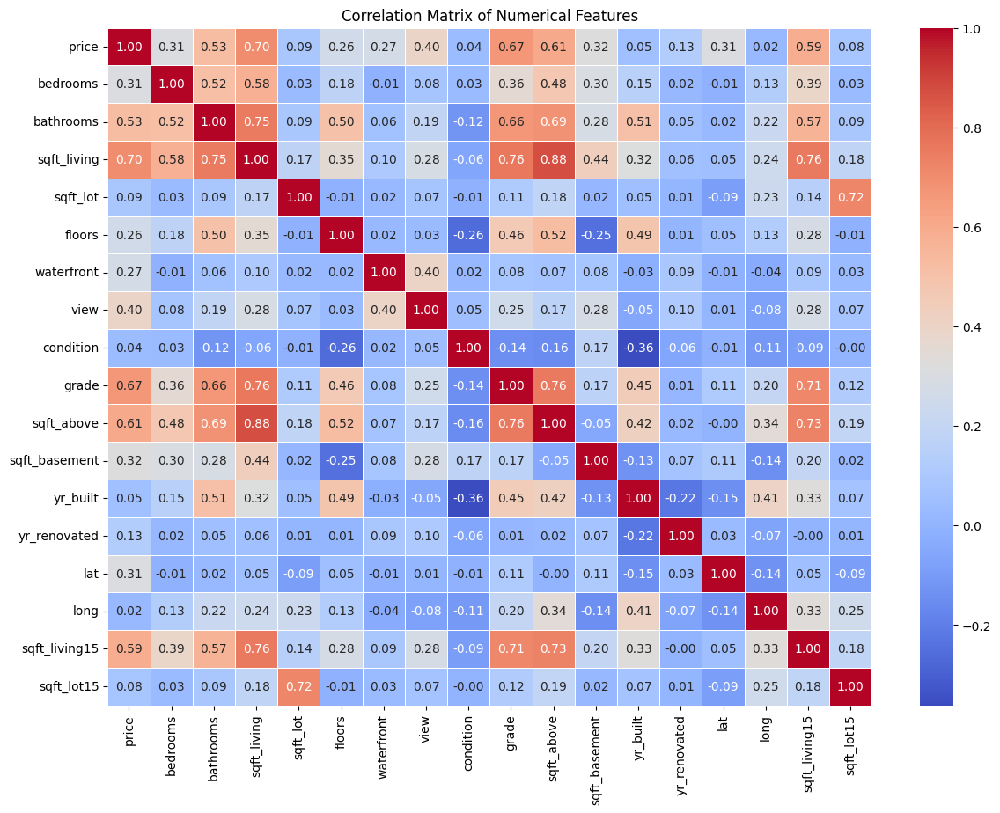

In [13]:
correlation_matrix = df.corr(numeric_only=True)

plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()


In [14]:
mask=np.triu(correlation_matrix)

In [15]:
cor = df.corr(numeric_only=True)

print('Top 15 positive correlations:\n')
positive_cor = cor.unstack().sort_values(ascending=False).drop_duplicates()
count = 0
for i in range(len(positive_cor)):
    pair = positive_cor.index[i]
    value = positive_cor[i]
    if pair[0] != pair[1] and value > 0:
        count += 1
        print(f"{count}) {value:.2f} => {pair}")
    if count == 15:
        break

Top 15 positive correlations:

1) 0.88 => ('sqft_above', 'sqft_living')
2) 0.76 => ('sqft_living', 'grade')
3) 0.76 => ('sqft_living', 'sqft_living15')
4) 0.76 => ('grade', 'sqft_above')
5) 0.75 => ('bathrooms', 'sqft_living')
6) 0.73 => ('sqft_above', 'sqft_living15')
7) 0.72 => ('sqft_lot', 'sqft_lot15')
8) 0.71 => ('grade', 'sqft_living15')
9) 0.70 => ('sqft_living', 'price')
10) 0.69 => ('sqft_above', 'bathrooms')
11) 0.67 => ('price', 'grade')
12) 0.66 => ('bathrooms', 'grade')
13) 0.61 => ('price', 'sqft_above')
14) 0.59 => ('sqft_living15', 'price')
15) 0.58 => ('bedrooms', 'sqft_living')


C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\990137317.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value = positive_cor[i]


In [16]:
print('\nTop 15 negative correlations:\n')
negative_cor = cor.unstack().sort_values(ascending=True).drop_duplicates()
count = 0
for i in range(len(negative_cor)):
    pair = negative_cor.index[i]
    value = negative_cor[i]
    if pair[0] != pair[1] and value < 0:
        count += 1
        print(f"{count}) {value:.2f} => {pair}")
    if count == 15:
        break


Top 15 negative correlations:

1) -0.36 => ('condition', 'yr_built')
2) -0.26 => ('condition', 'floors')
3) -0.25 => ('sqft_basement', 'floors')
4) -0.22 => ('yr_renovated', 'yr_built')
5) -0.16 => ('condition', 'sqft_above')
6) -0.15 => ('yr_built', 'lat')
7) -0.14 => ('sqft_basement', 'long')
8) -0.14 => ('condition', 'grade')
9) -0.14 => ('long', 'lat')
10) -0.13 => ('yr_built', 'sqft_basement')
11) -0.12 => ('bathrooms', 'condition')
12) -0.11 => ('condition', 'long')
13) -0.09 => ('sqft_living15', 'condition')
14) -0.09 => ('sqft_lot15', 'lat')
15) -0.09 => ('lat', 'sqft_lot')


C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\44637328.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value = negative_cor[i]


In [17]:
correlation_matrix = df.corr(numeric_only=True)
top_positive_corr = correlation_matrix['price'].sort_values(ascending=False)[1:16]

print("Top 15 Positive Correlations with Price:")
print(top_positive_corr)

Top 15 Positive Correlations with Price:
sqft_living      0.702035
grade            0.667434
sqft_above       0.605567
sqft_living15    0.585379
bathrooms        0.525138
view             0.397293
sqft_basement    0.323816
bedrooms         0.308350
lat              0.307003
waterfront       0.266369
floors           0.256794
yr_renovated     0.126434
sqft_lot         0.089661
sqft_lot15       0.082447
yr_built         0.054012
Name: price, dtype: float64


C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\2004744981.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlation_with_price.values, y=correlation_with_price.index, palette="coolwarm")


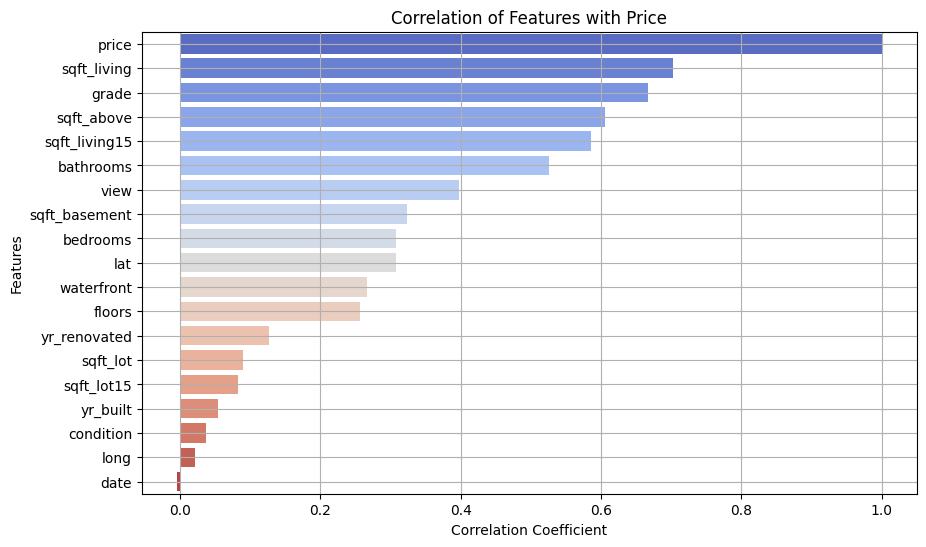

In [18]:
correlation_with_price = df.corr()['price'].sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_with_price.values, y=correlation_with_price.index, palette="coolwarm")
plt.title('Correlation of Features with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.grid(True)
plt.show()

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\3698641074.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top15_positive_corr.values, y=top15_positive_corr.index, palette='viridis')


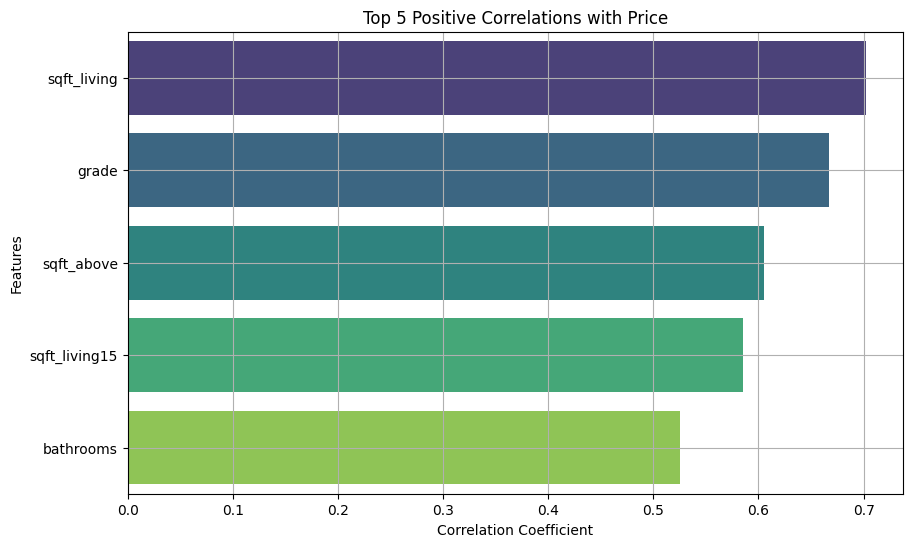

In [19]:
correlation = df.corr()['price'].sort_values(ascending=False)
top15_positive_corr = correlation[1:6]

plt.figure(figsize=(10, 6))
sns.barplot(x=top15_positive_corr.values, y=top15_positive_corr.index, palette='viridis')
plt.title('Top 5 Positive Correlations with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.grid(True)
plt.show()

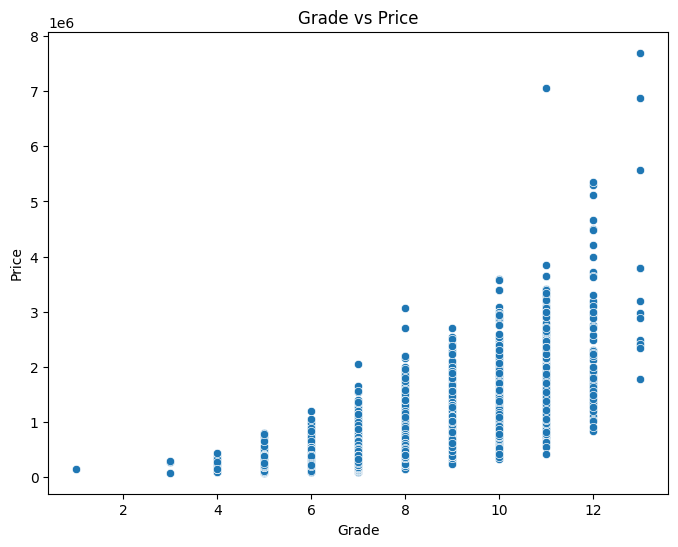

In [20]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='grade', y='price')
plt.title('Grade vs Price')
plt.xlabel('Grade')
plt.ylabel('Price')
plt.show()


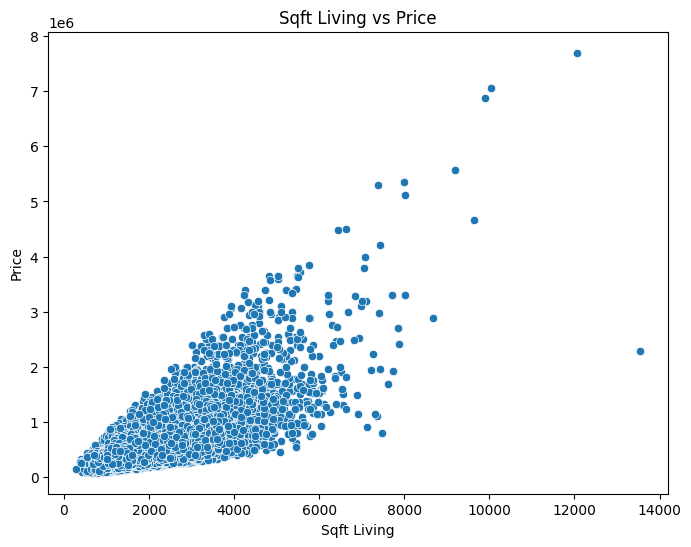

In [21]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='sqft_living', y='price')
plt.title('Sqft Living vs Price')
plt.xlabel('Sqft Living')
plt.ylabel('Price')
plt.show()

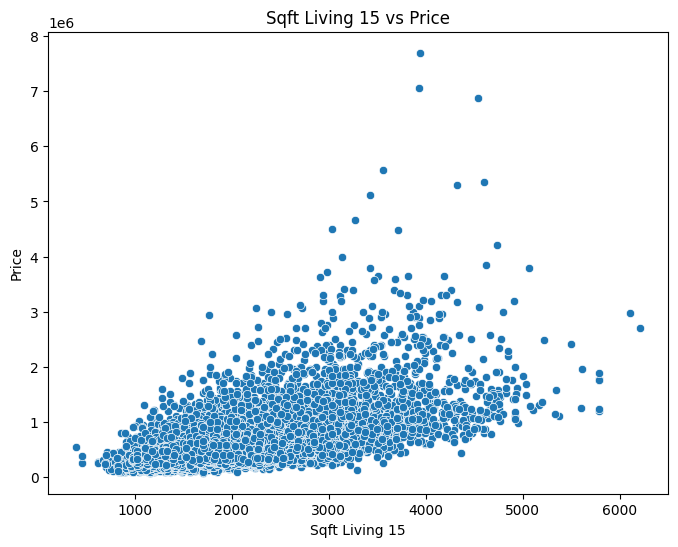

In [22]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='sqft_living15', y='price')
plt.title('Sqft Living 15 vs Price')
plt.xlabel('Sqft Living 15')
plt.ylabel('Price')
plt.show()

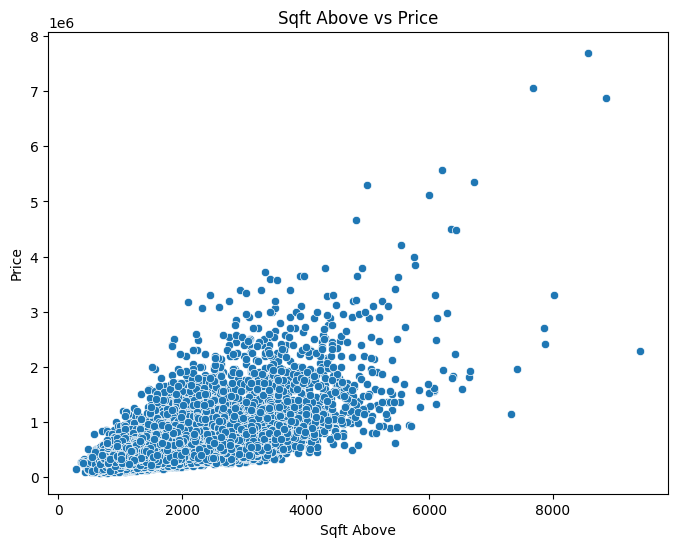

In [23]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='sqft_above', y='price')
plt.title('Sqft Above vs Price')
plt.xlabel('Sqft Above')
plt.ylabel('Price')
plt.show()

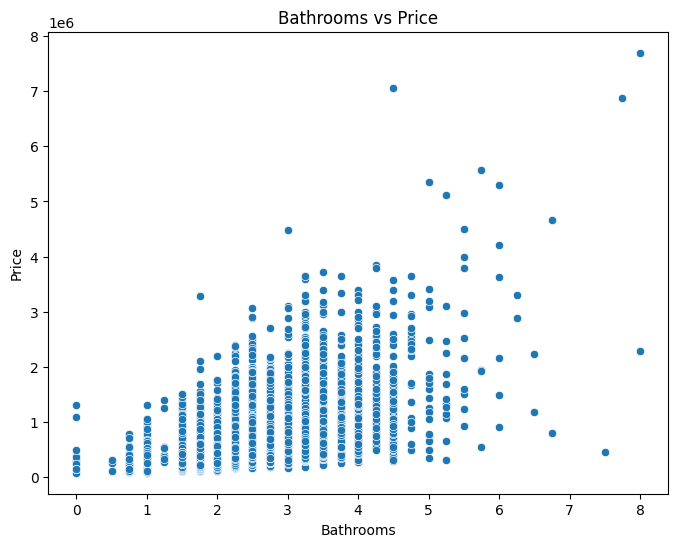

In [24]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='bathrooms', y='price')
plt.title('Bathrooms vs Price')
plt.xlabel('Bathrooms')
plt.ylabel('Price')
plt.show()

<div style="background-color:#689080; padding:10px; border-radius:10px">
    <h1 style="color:#E3DED1; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
        📊 Data Visualization for House  📊
    </h1>
</div>

In this section, we perform various data visualizations to understand the relationship between different house features and the **price** of the house. Data visualizations help us identify patterns, correlations, and outliers.

1. **Price vs Square Foot Living Area**
   - We plot a scatter plot to visualize how the price of a house is related to its living area (`sqft_living`). The x-axis shows the living area, and the y-axis shows the **log-transformed house price**. This helps us observe if there's a linear or non-linear relationship between living area and price.
   
2. **Average Price by Number of Bedrooms**
   - A bar plot is used to show the average house price for each number of bedrooms. This allows us to quickly see how the number of bedrooms influences house prices.

3. **House Condition and Price Distribution**
   - A boxplot is used to visualize how house prices vary by the **condition** of the house. This shows the range, median, and outliers for each house condition.

4. **Distribution of Year Built**
   - We use a histogram to see the distribution of the **year houses were built**. This helps in understanding how old the houses in the dataset are and how this might correlate with house prices.

Each plot gives us useful insights into the data and helps in better understanding how each feature might affect the house price.

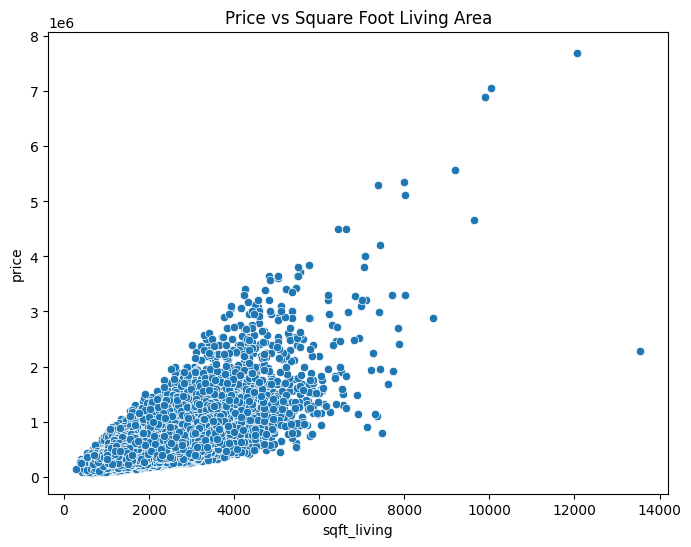

In [25]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='sqft_living', y='price', data=df)
plt.title('Price vs Square Foot Living Area')
plt.show()

In [26]:
avg_price_by_bedrooms = df.groupby('bedrooms')['price'].mean().reset_index()
avg_price_by_bedrooms

,bedrooms,price
0,0,4.095038e+05
1,1,3.176429e+05
2,2,4.013727e+05
3,3,4.662321e+05
4,4,6.354195e+05
5,5,7.865998e+05
6,6,8.255206e+05
7,7,9.511847e+05
8,8,1.105077e+06
9,9,8.939998e+05


C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\730444054.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df['bedrooms'], y=df['price'], estimator=lambda x: x.mean(), palette="viridis")


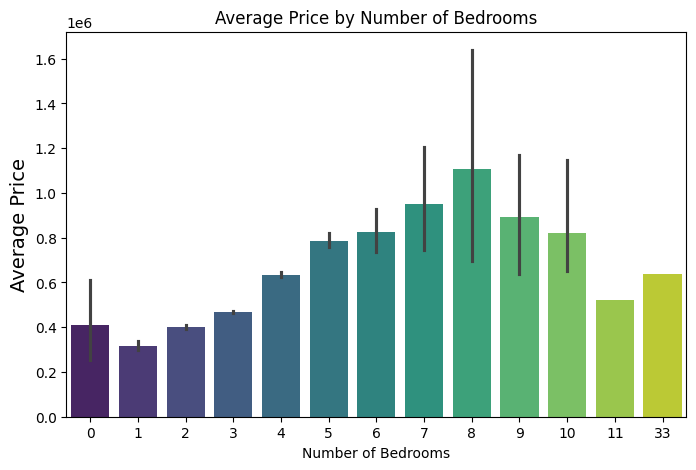

In [27]:
plt.figure(figsize=(8, 5))
sns.barplot(x=df['bedrooms'], y=df['price'], estimator=lambda x: x.mean(), palette="viridis")
plt.title("Average Price by Number of Bedrooms")
plt.xlabel("Number of Bedrooms", size=10)
plt.ylabel("Average Price", size=14)
plt.show()

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\3865327624.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='condition', data=df, palette="viridis")


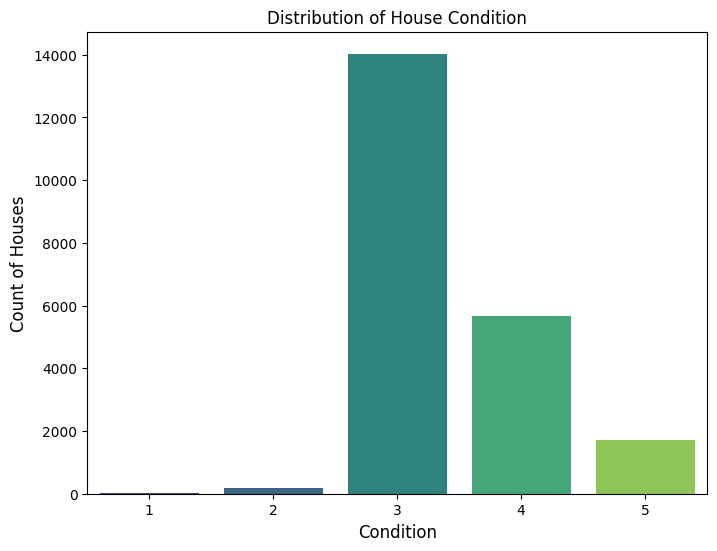

In [28]:
plt.figure(figsize=(8, 6))
sns.countplot(x='condition', data=df, palette="viridis")
plt.title("Distribution of House Condition")
plt.xlabel("Condition", size=12)
plt.ylabel("Count of Houses", size=12)
plt.show()

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\3212624637.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='condition', y='price', data=df, palette="viridis")


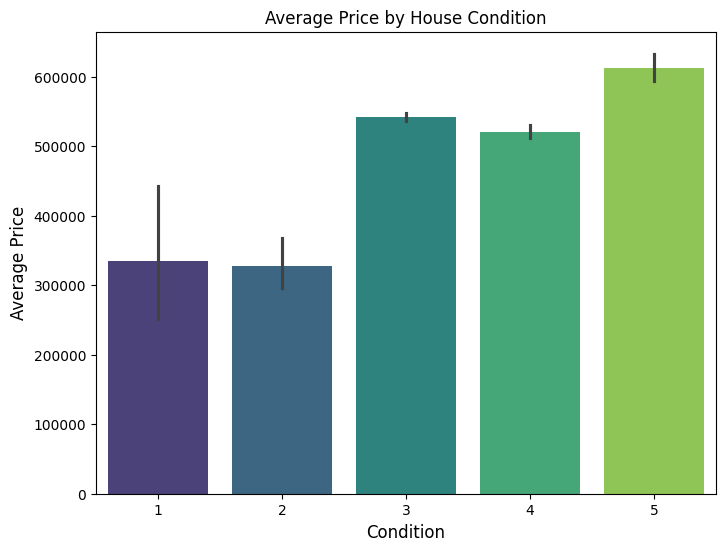

In [29]:
plt.figure(figsize=(8, 6))
sns.barplot(x='condition', y='price', data=df, palette="viridis")
plt.title("Average Price by House Condition")
plt.xlabel("Condition", size=12)
plt.ylabel("Average Price", size=12)
plt.show()

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\2698622939.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['condition'], y=df['price'], palette="coolwarm")


Text(0, 0.5, 'Price')

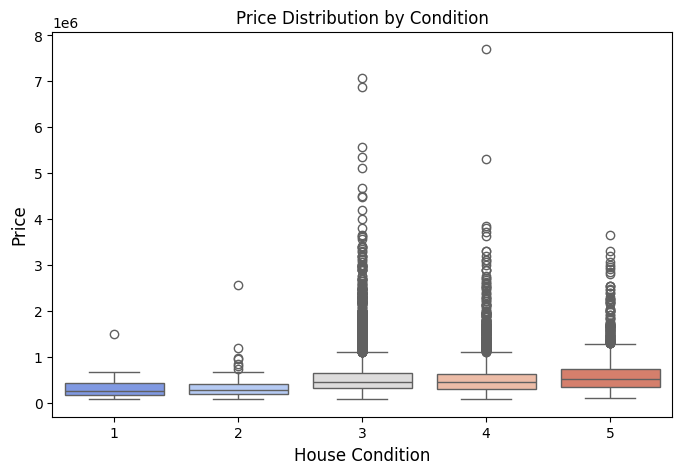

In [30]:
# Price Distribution by Condition 
plt.figure(figsize=(8,5))
sns.boxplot(x=df['condition'], y=df['price'], palette="coolwarm")
plt.title("Price Distribution by Condition")
plt.xlabel("House Condition", size=12)
plt.ylabel("Price", size=12)

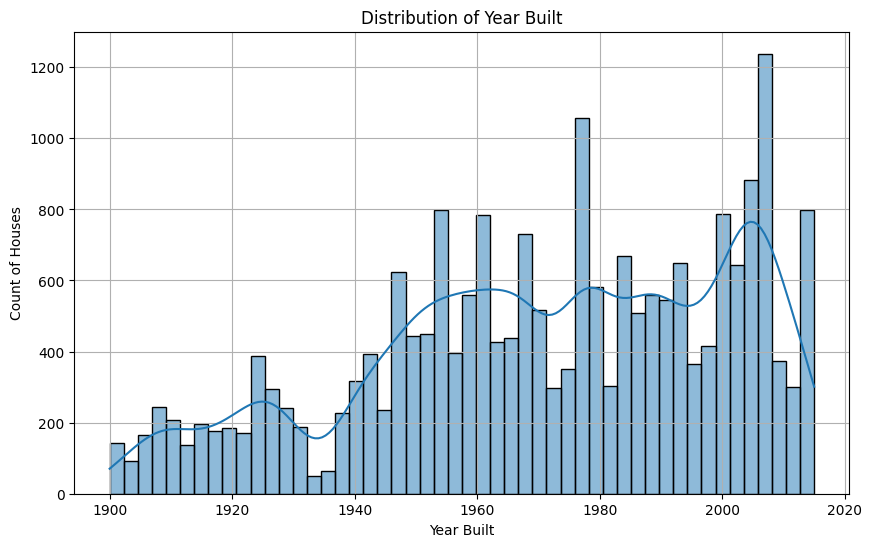

In [31]:
plt.figure(figsize=(10, 6))
sns.histplot(df['yr_built'], bins=50, kde=True)
plt.title('Distribution of Year Built')
plt.xlabel('Year Built')
plt.ylabel('Count of Houses')
plt.grid(True)
plt.show()

In [32]:
df['year'] = pd.to_datetime(df['date']).dt.year

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\2463599930.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='year', data=df, palette='Set2')


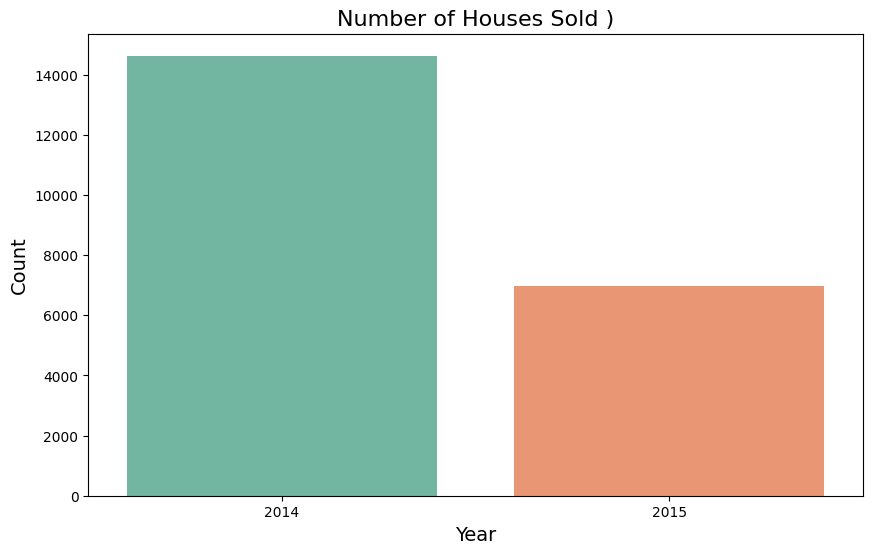

In [33]:
plt.figure(figsize=(10, 6))
sns.countplot(x='year', data=df, palette='Set2')
plt.title('Number of Houses Sold )', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

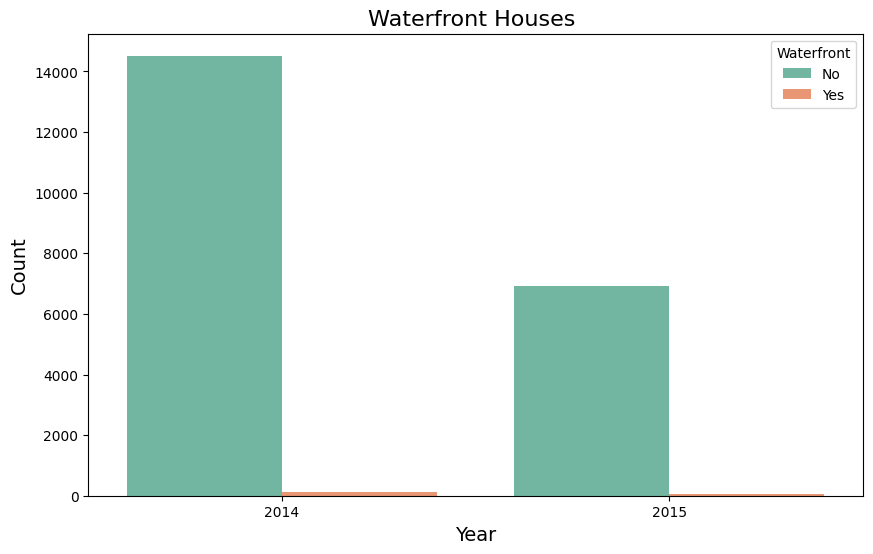

In [34]:
plt.figure(figsize=(10, 6))
sns.countplot(x='year', hue='waterfront', data=df, palette='Set2')
plt.title('Waterfront Houses ', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Waterfront', labels=['No', 'Yes'])
plt.show()

<div style="background-color:#F68961; padding:10px; border-radius:10px">
    <h1 style="color:#000000; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
        Distribution 
    </h1>
</div>

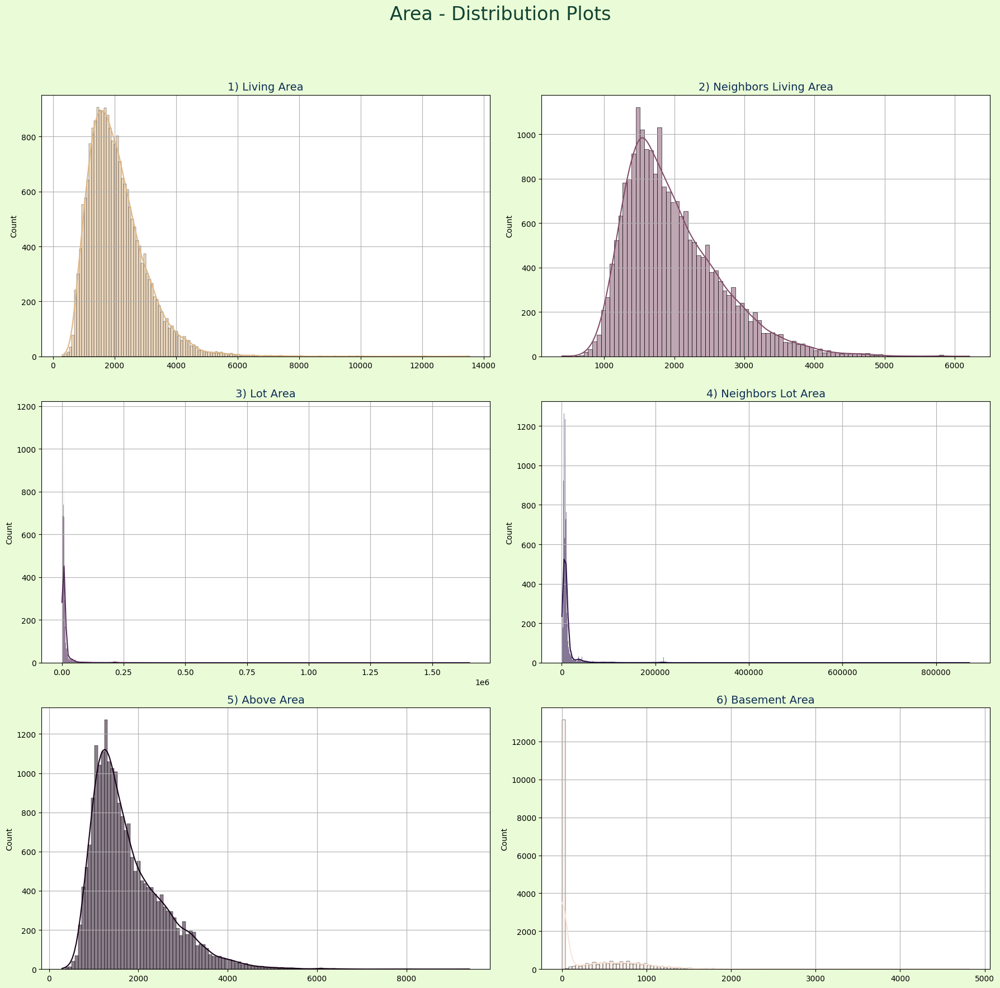

In [35]:
# Columns related to area
columns_area = ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_lot15', 'sqft_above', 'sqft_basement']
titles_area = ['Living Area', 'Neighbors Living Area', 'Lot Area', 'Neighbors Lot Area', 'Above Area', 'Basement Area']

my_colors = ['#FAE5D8', '#DFB682', '#824D69', '#522959', '#2A114B', '#180018']

def plot_distribution(columns, titles, main_title):
    num_cols = len(columns)
    num_rows = math.ceil(num_cols / 2)

    plt.figure(figsize=(18, 6 * num_rows), facecolor='#EAFCD7')

    for i, (column, title) in enumerate(zip(columns, titles), 1):
        plt.subplot(num_rows, 2, i)
        sns.histplot(df[column], kde=True, color=my_colors[i % len(my_colors)])
        plt.title(f'{i}) {title}', color='#0C2D57', fontsize=14)
        plt.xlabel('')
        plt.grid(True)

    plt.suptitle(f'{main_title} - Distribution Plots\n', color='#114232', size=24)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_distribution(columns_area, titles_area, "Area")


In this section of the code, the columns related to the area of the houses are divided into **columns_area**, and the `plot_distribution` function is used to plot the distribution of each of these columns.

The goal of this part is to visually analyze the distribution of these areas to identify patterns or outliers in the data.

• In general, they all have a normal distribution.

• However, since the scale on the x-axis in graphs 3, graphs 4 and graphs 6 is very wide, it is understood that there is outlier data in these colums.


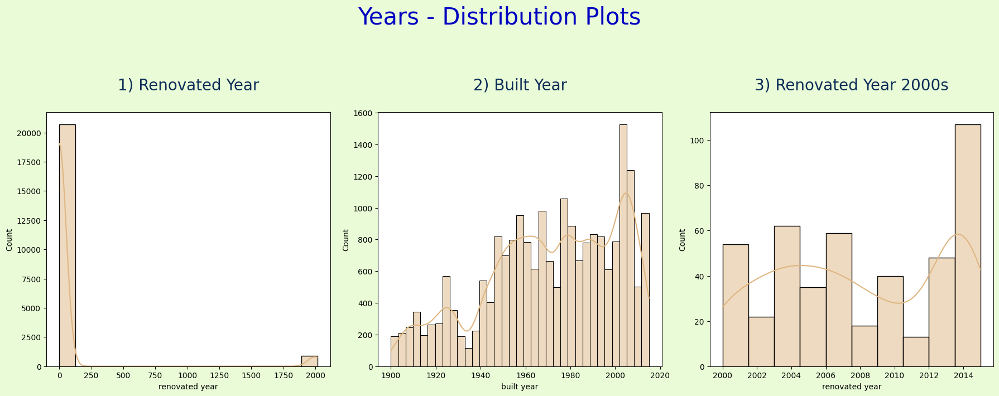

In [36]:
my_colors = ['#FAE5D8', '#DFB682', '#824D69', '#522959', '#2A114B', '#180018']

columns_year = ['yr_renovated', 'yr_built']
titles_year = ['Renovated Year', 'Built Year']

num_cols = len(columns_year)
num_rows = math.ceil(num_cols / 1)

plt.figure(figsize=(18,12), facecolor='#EAFCD7')  # Background color

for i, (column, title) in enumerate(zip(columns_year, titles_year), 1):
    plt.subplot(num_rows, num_rows + 1, i)  # Adjust for extra subplot
    sns.histplot(df[column], color=my_colors[1], kde=True)
    plt.title(f'{i}) {title}\n', color='#0C2D57', fontsize=20)
    plt.xlabel(f"{title.lower()}")

df_filtered = df[df['yr_renovated'] >= 2000]
plt.subplot(num_rows, num_rows + 1, i + 1)
sns.histplot(df_filtered['yr_renovated'], color=my_colors[1], kde=True)
plt.title(f'\n{i + 1}) Renovated Year 2000s\n', color='#0C2D57', fontsize=20)
plt.xlabel('renovated year')

plt.suptitle('Years - Distribution Plots\n', color='#0000C1', size=30)
plt.tight_layout()
plt.show()

 Most of the houses have not been renovated/restored because the years of restoration are 0, but the restored houses were restored mostly in 2015. Considering that the data set is from 2016, it can be said that if it was restored, it was done at an acceptable recent date.

• The construction history of the houses spans a very long period (1900-2015), with the largest number of houses built between 2000-2015. But there seem to be many houses that can be considered old.

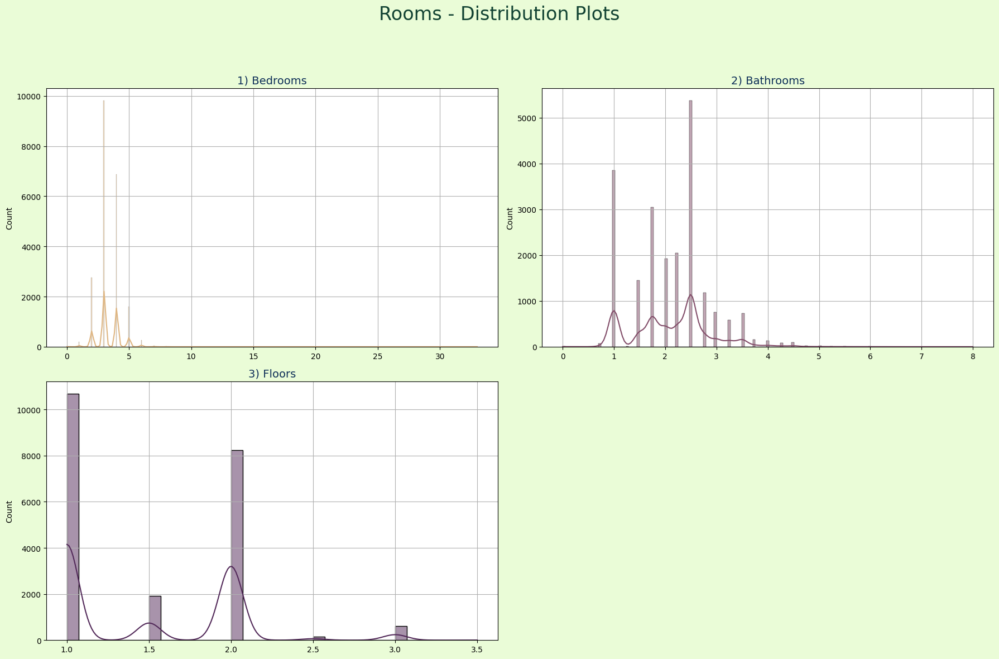

In [37]:
columns_room = ['bedrooms', 'bathrooms', 'floors']
titles_room = ['Bedrooms', 'Bathrooms', 'Floors']

my_colors = ['#FAE5D8', '#DFB682', '#824D69', '#522959', '#2A114B', '#180018']

def plot_distribution(columns, titles, main_title):
    num_cols = len(columns)
    num_rows = math.ceil(num_cols / 2)

    plt.figure(figsize=(18, 6 * num_rows), facecolor='#EAFCD7')

    for i, (column, title) in enumerate(zip(columns, titles), 1):
        plt.subplot(num_rows, 2, i)
        sns.histplot(df[column], kde=True, color=my_colors[i % len(my_colors)])
        plt.title(f'{i}) {title}', color='#0C2D57', fontsize=14)
        plt.xlabel('')
        plt.grid(True)

    plt.suptitle(f'{main_title} - Distribution Plots\n', color='#114232', size=24)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_distribution(columns_room, titles_room, "Rooms")


<span style="font-size:30px; font-family: 'Georgia', serif; color:#180018; font-weight:bold;">All Distribution Plots</span>

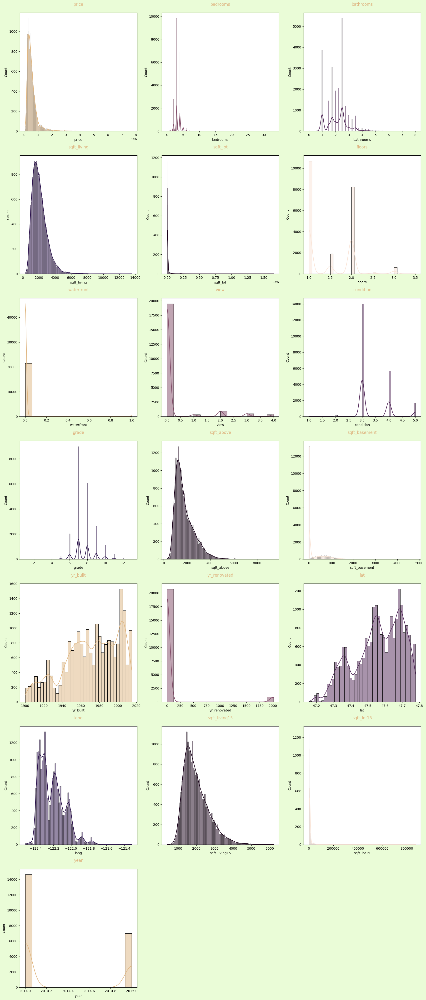

In [38]:
numeric_columns = df.select_dtypes(include=['number']).columns
my_colors = ['#FAE5D8', '#DFB682', '#824D69', '#522959', '#2A114B', '#180018']

num_cols = 3

num_rows = math.ceil(len(numeric_columns) / num_cols)

plt.figure(figsize=(18, 6 * num_rows), facecolor='#EAFCD7')

for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_rows, num_cols, i)  
    plt.title(f'{column}\n', color='#DFB682')
    sns.histplot(df[column], kde=True, color=my_colors[i % len(my_colors)]) 

plt.tight_layout()
plt.show()


<span style="font-size:30px; font-family: 'Georgia', serif; color:#180018; font-weight:bold;">COUNTPLOTS</span>

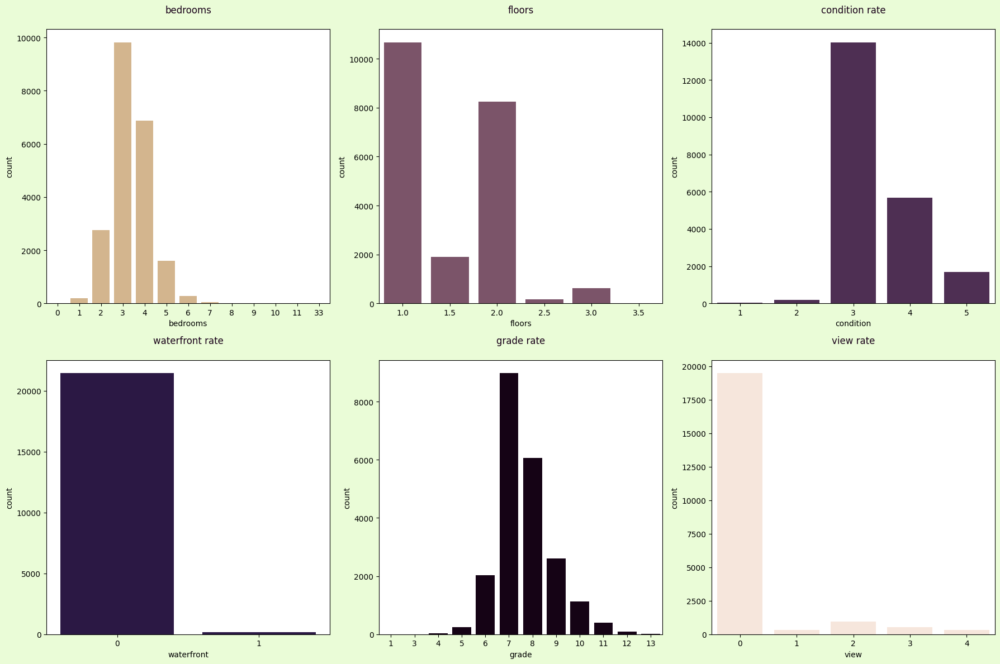

In [39]:
df_ord_categoricals = df[['bedrooms', 'floors', 'condition', 'waterfront', 'grade', 'view']]
ord_categoricals_titles = ['bedrooms', 'floors', 'condition rate', 'waterfront rate', 'grade rate', 'view rate', 'sale year']

my_colors = ['#FAE5D8', '#DFB682', '#824D69', '#522959', '#2A114B', '#180018']
num_cols = 3

num_rows = math.ceil(len(df_ord_categoricals.columns) / num_cols)

plt.figure(figsize=(18, 6 * num_rows), facecolor='#EAFCD7')
for i, (column, title) in enumerate(zip(df_ord_categoricals.columns, ord_categoricals_titles), 1):
    plt.subplot(num_rows, num_cols, i)  
    plt.title(f'{title}\n', color='#180018')
    sns.countplot(x=df[column], color=my_colors[i % len(my_colors)])  

plt.tight_layout()
plt.show()

- **The most common number of bedrooms is 3.**
  
- **Houses usually have 1 or 2 floors.**

- **The condition rate of the houses is mostly average or above average.**

- **99% of the houses are not waterfront.**

- **The structural design and quality of the houses is most frequently 7 out of 13.**

- **Surprisingly, a large portion of the houses have a view rate of 0 out of 4.**

- **The ratio of houses sold in 2015 to 2014 is approximately 1:2.**

In [40]:
m = folium.Map(location=[47.6062, -122.3321], zoom_start=10)

for _, row in df.iterrows():
    condition = row['condition']
    
    if condition == 1:
        color = 'red'
    elif condition == 2:
        color = 'orange'
    elif condition == 3:
        color = 'yellow'
    elif condition == 4:
        color = 'green'
    elif condition == 5:
        color = 'blue'
    else:
        color = 'gray'

    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=3,
        color=color,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

popup_text = """
<b>🏠 House Condition Map</b><br><br>
This interactive map shows houses in Seattle colored by their <b>condition</b> (1 = Poor, 5 = Excellent).<br>
Each circle represents a house.<br>
Zoom and pan to explore the map! 🗺️🔍<br><br>
<b>Condition Scale:</b><br>
1 🔴 Very Poor<br>
2 🟠 Poor<br>
3 🟡 Average<br>
4 🟢 Very Good<br>
5 🔵 Excellent
"""

info_popup = folium.Marker(
    location=[47.60, -122.34],  
    popup=folium.Popup(popup_text, max_width=300),
    icon=folium.Icon(color='blue', icon='info-sign')
)

info_popup.add_to(m)
m

### 🏠 House Condition Map

This interactive map displays the locations of houses in Seattle, colored by their **condition**.

The `condition` score ranges from **1 (Very Poor)** to **5 (Excellent)**:

- 🟥 **1** - Very Poor  
- 🟧 **2** - Poor  
- 🟨 **3** - Average  
- 🟩 **4** - Very Good  
- 🟦 **5** - Excellent  

Each circle on the map represents a house, and the color helps you quickly understand the overall house condition in different areas.  
You can **zoom**, **pan**, and **explore** to discover patterns across Seattle neighborhoods. 🗺️🔍

In [41]:
heat_data_price = [[row['lat'], row['long'], row['price']] for index, row in df.iterrows()]
m_price = folium.Map(location=[47.6062, -122.3321], zoom_start=10)

HeatMap(heat_data_price, radius=10, blur=15, max_val=max(df['price'])).add_to(m_price)

popup_text = """
This interactive map shows houses in Seattle colored by their<b>Price Range</b><br>.
Low 🟢: Affordable<br>
Medium 🟡: Mid-range<br>
High 🔴: Expensive
"""

info_popup = folium.Marker(
    location=[47.60, -122.34],  
    popup=folium.Popup(popup_text, max_width=300),
    icon=folium.Icon(color='blue', icon='info-sign')
)
info_popup.add_to(m_price)

m_price


C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\2670125435.py:4: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(heat_data_price, radius=10, blur=15, max_val=max(df['price'])).add_to(m_price)


<div style="background-color:#689080; padding:0px; border-radius:10px">
    <h1 style="color:#E3DED1; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
        Log Transformation and Outlier Detection
    </h1>
</div>

To handle the right-skewed distribution of house prices, we applied a logarithmic transformation using `np.log()`. This helps normalize the distribution and makes it easier to detect outliers.

- The first plot shows the distribution of the log-transformed house prices.
- The second plot is a boxplot to visualize potential outliers after transformation.

Next, we calculate the **Interquartile Range (IQR)** to define the range for detecting outliers:
- **Q1**: First quartile (25th percentile)
- **Q3**: Third quartile (75th percentile)
- **IQR** = Q3 - Q1

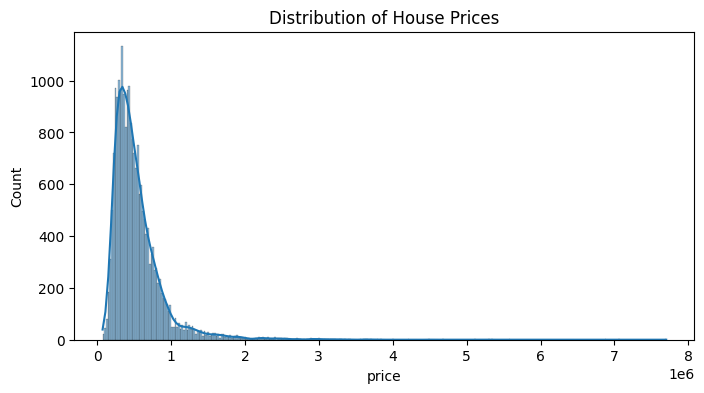

In [42]:
plt.figure(figsize=(8, 4))
sns.histplot(df['price'], kde=True)
plt.title('Distribution of House Prices')
plt.show()

Houses are generally priced between 0-2 million, The price distribution generally resembles a Normal (Gaussian) distribution, but there are some outlier data that prevent it from being completely similar. These are the ones whose price is more than 2 million, especially those around 7-8 million.

In [43]:
print(f"Price before log transformation - Mean: {df['price'].mean()}, Std: {df['price'].std()}")

Price before log transformation - Mean: 540088.1417665294, Std: 367127.19648269983


In [44]:
df['price'] = np.log(df['price'])

In [45]:
print(f"Price log transformation - Mean: {df['price'].mean()}, Std: {df['price'].std()}")

Price log transformation - Mean: 13.047816917155401, Std: 0.5266845190328355


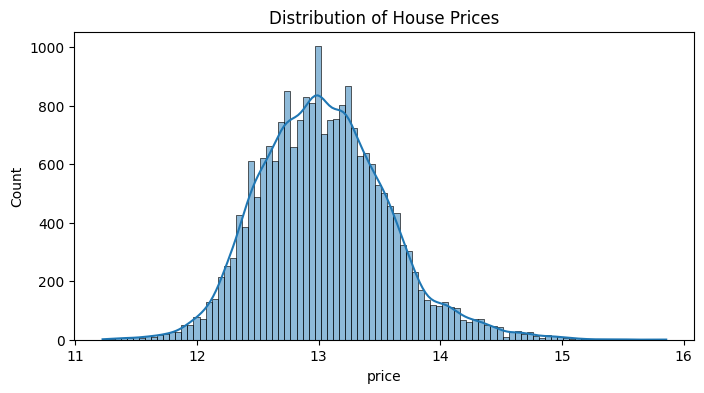

In [46]:
plt.figure(figsize=(8, 4))
sns.histplot(df['price'], kde=True)
plt.title('Distribution of House Prices')
plt.show()

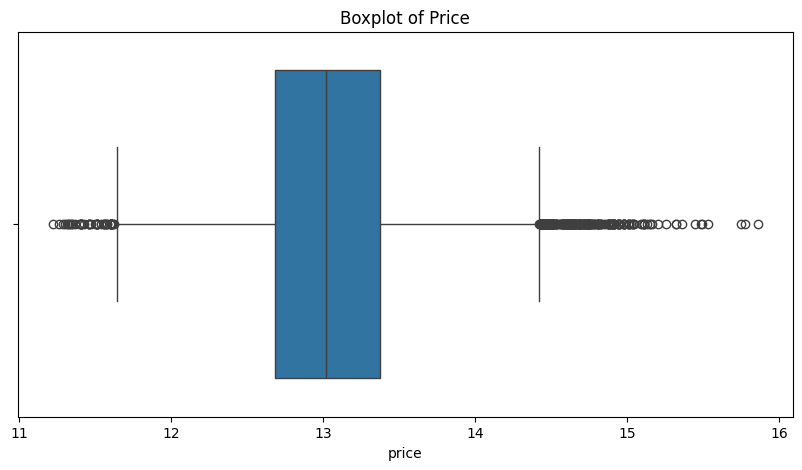

In [47]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df['price'])
plt.title('Boxplot of Price')
plt.show()

In [48]:
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df['price'] < lower_bound) | (df['price'] > upper_bound)]
print(f"Number of outliers after log: {len(outliers)}")

Number of outliers after log: 333


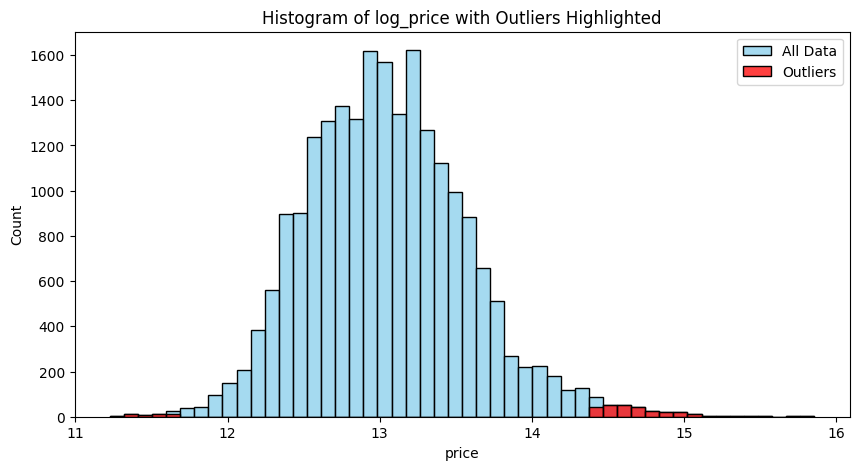

In [49]:
plt.figure(figsize=(10,5))
sns.histplot(df['price'], bins=50, color='skyblue', label='All Data')
sns.histplot(outliers['price'], bins=50, color='red', label='Outliers')
plt.legend()
plt.title('Histogram of log_price with Outliers Highlighted')
plt.show()

(21280, 20)


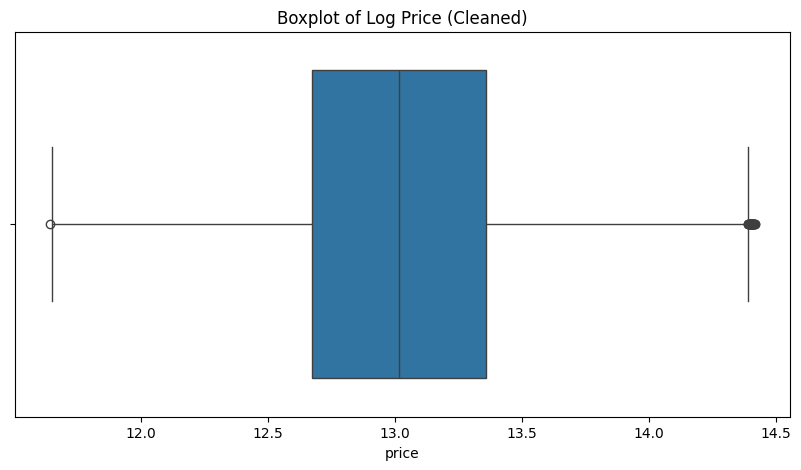

In [50]:
df_cleaned = df[(df['price'] >= lower_bound) & (df['price'] <= upper_bound)]
print(df_cleaned.shape)
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_cleaned['price'])
plt.title('Boxplot of Log Price (Cleaned)')
plt.show()

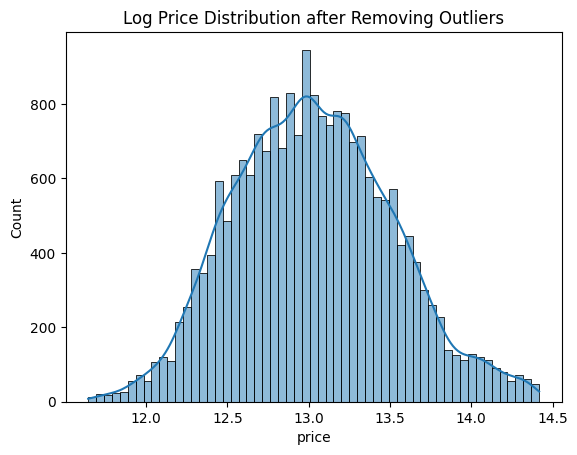

In [51]:
sns.histplot(df_cleaned['price'], kde=True)
plt.title('Log Price Distribution after Removing Outliers')
plt.show()

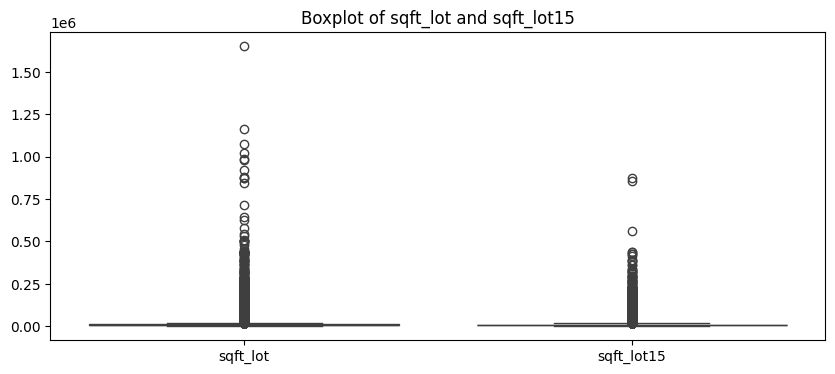

In [52]:
plt.figure(figsize=(10, 4))
sns.boxplot(data=df[['sqft_lot', 'sqft_lot15']])
plt.title("Boxplot of sqft_lot and sqft_lot15")
plt.show()

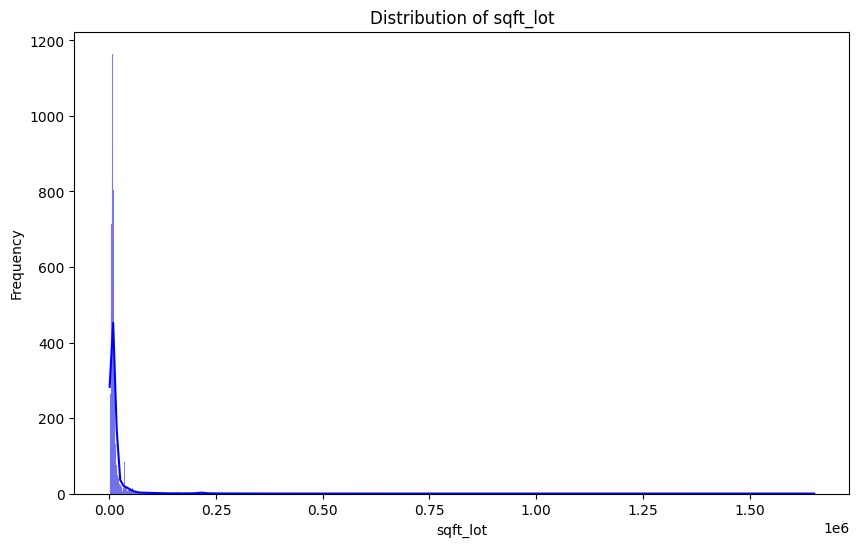

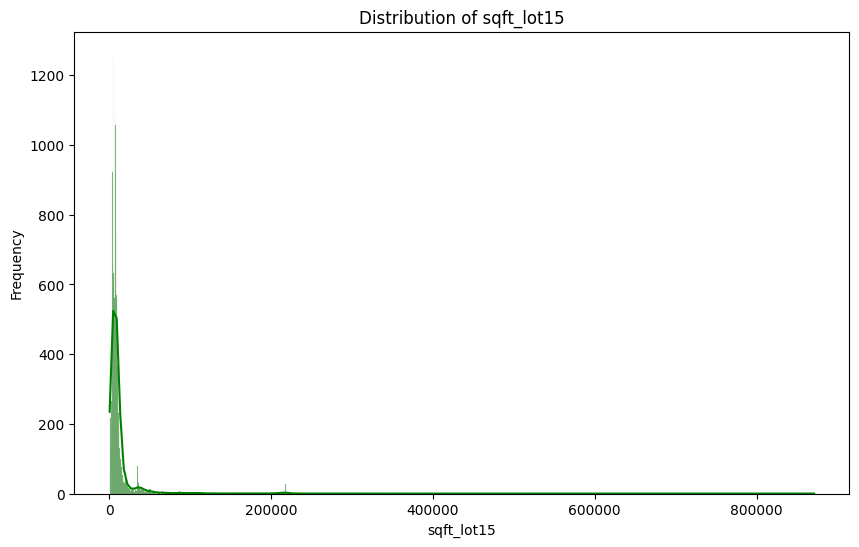

In [53]:
plt.figure(figsize=(10,6))
sns.histplot(df['sqft_lot'], kde=True, color='blue')
plt.title('Distribution of sqft_lot')
plt.xlabel('sqft_lot')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10,6))
sns.histplot(df['sqft_lot15'], kde=True, color='green')
plt.title('Distribution of sqft_lot15')
plt.xlabel('sqft_lot15')
plt.ylabel('Frequency')
plt.show()

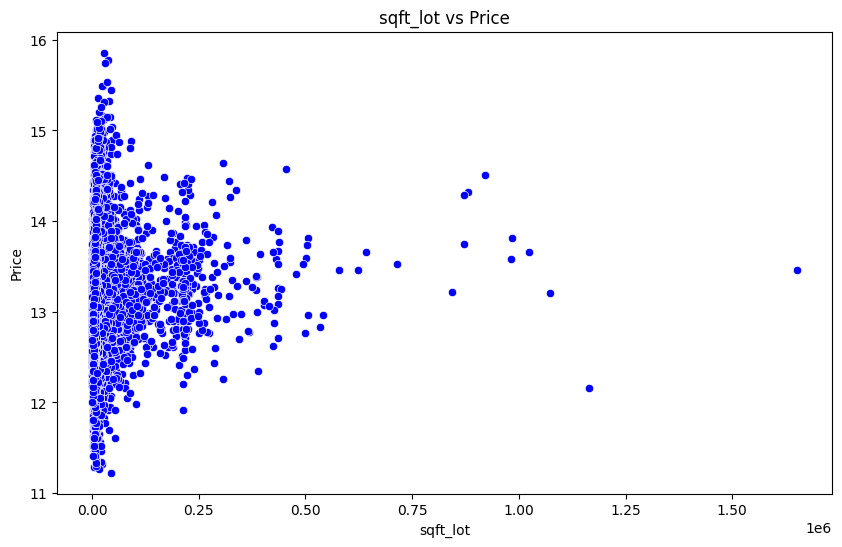

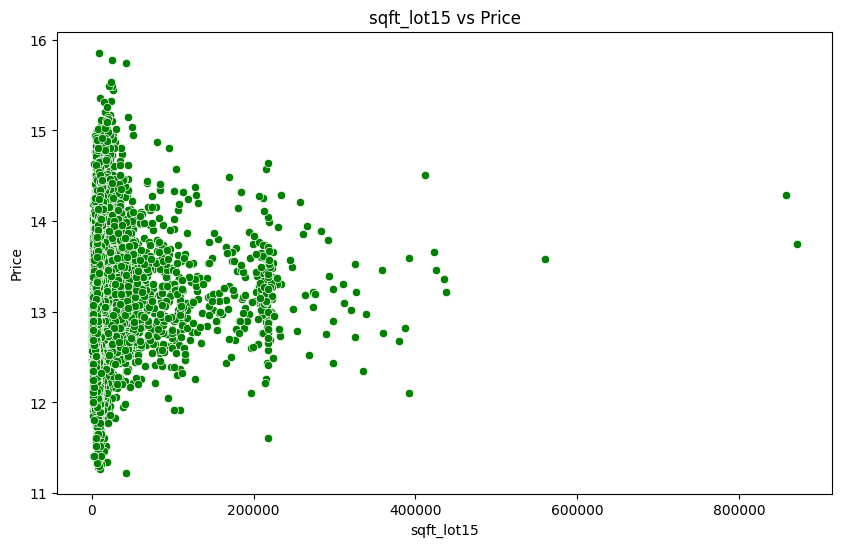

In [54]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df['sqft_lot'], y=df['price'], color='blue')
plt.title('sqft_lot vs Price')
plt.xlabel('sqft_lot')
plt.ylabel('Price')
plt.show()

plt.figure(figsize=(10,6))
sns.scatterplot(x=df['sqft_lot15'], y=df['price'], color='green')
plt.title('sqft_lot15 vs Price')
plt.xlabel('sqft_lot15')
plt.ylabel('Price')
plt.show()

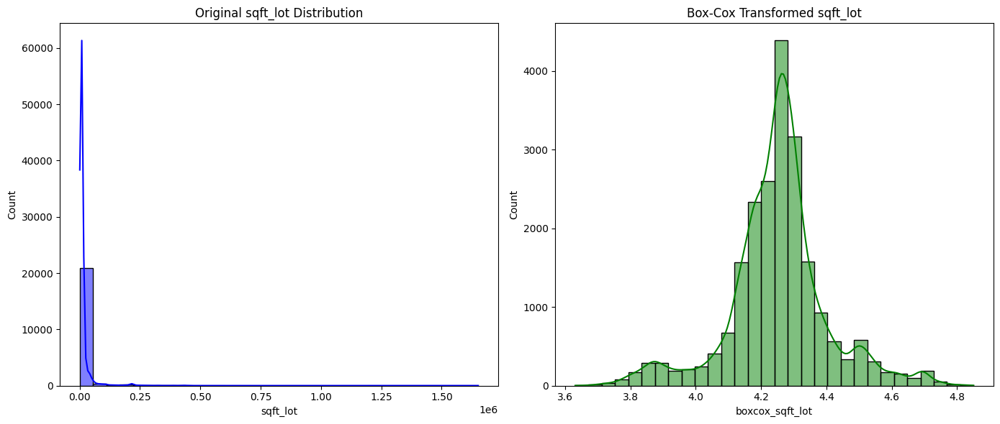

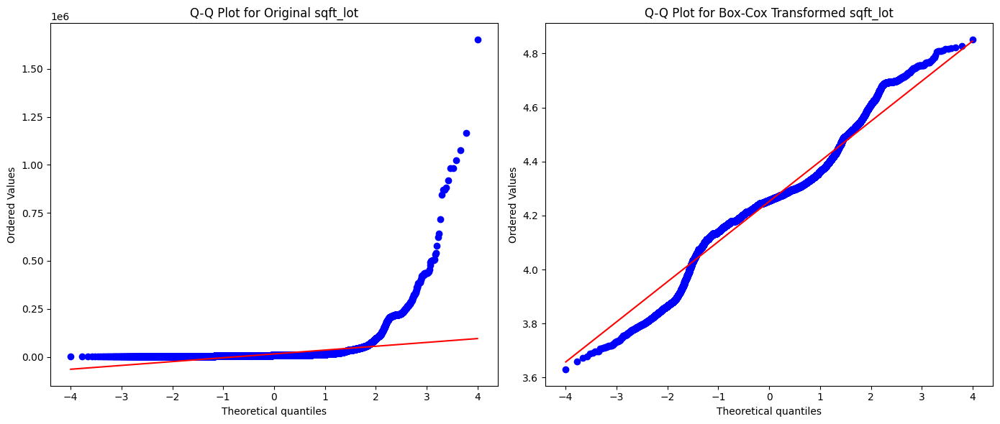

In [55]:
df['boxcox_sqft_lot'], lam = stats.boxcox(df['sqft_lot'] + 1)  
df['boxcox_sqft_lot15'], lam15 = stats.boxcox(df['sqft_lot15'] + 1)

df['yeojohnson_sqft_lot'], lam_yj = stats.yeojohnson(df['sqft_lot'])
df['yeojohnson_sqft_lot15'], lam_yj15 = stats.yeojohnson(df['sqft_lot15'])
plt.figure(figsize=(14, 6))

# Original data
plt.subplot(1, 2, 1)
sns.histplot(df['sqft_lot'], kde=True, color='blue', bins=30)
plt.title('Original sqft_lot Distribution')

# After Box-Cox transformation
plt.subplot(1, 2, 2)
sns.histplot(df['boxcox_sqft_lot'], kde=True, color='green', bins=30)
plt.title('Box-Cox Transformed sqft_lot')

plt.tight_layout()
plt.show()
plt.figure(figsize=(14, 6))

# Q-Q plot for original data
plt.subplot(1, 2, 1)
stats.probplot(df['sqft_lot'], dist="norm", plot=plt)
plt.title('Q-Q Plot for Original sqft_lot')

# Q-Q plot for Box-Cox transformed data
plt.subplot(1, 2, 2)
stats.probplot(df['boxcox_sqft_lot'], dist="norm", plot=plt)
plt.title('Q-Q Plot for Box-Cox Transformed sqft_lot')

plt.tight_layout()
plt.show()


<div style="background-color:#A56ABD; padding:10px; border-radius:10px">
    <h1 style="color:#E3DED1; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
     Creating Models
    </h1>
</div>

In [56]:
df_cleaned.drop(['date'], axis=1, inplace=True)

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\4023078861.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.drop(['date'], axis=1, inplace=True)


In [57]:
X = df_cleaned.drop('price', axis=1)
y = df_cleaned['price']

In [58]:
"""

features = [
    'grade', 'sqft_living', 'sqft_living15', 'sqft_above', 'bathrooms',
    'lat', 'view', 'bedrooms', 'sqft_basement', 'floors', 'waterfront',
    'yr_renovated', 'sqft_lot', 'sqft_lot15', 'yr_built' 
]

X = df_cleaned[features]
Y = df_cleaned['price']


"""


"\n\nfeatures = [\n    'grade', 'sqft_living', 'sqft_living15', 'sqft_above', 'bathrooms',\n    'lat', 'view', 'bedrooms', 'sqft_basement', 'floors', 'waterfront',\n    'yr_renovated', 'sqft_lot', 'sqft_lot15', 'yr_built' \n]\n\nX = df_cleaned[features]\nY = df_cleaned['price']\n\n\n"

In [59]:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [60]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, Y_train)

LinearRegression()

In [61]:
y_pred_lin = lin_reg.predict(X_test)
print(f' R²: {r2_score(Y_test, y_pred_lin) * 100}')

 R²: 73.9436947559513


In [62]:
poly_reg = PolynomialFeatures(degree=2)
x_poly_train = poly_reg.fit_transform(X_train)
x_poly_test = poly_reg.transform(X_test)
lin_reg2 = LinearRegression()
lin_reg2.fit(x_poly_train, Y_train)
y_pred_poly = lin_reg2.predict(x_poly_test)
print(f'Polynomial Regression R² score: {r2_score(Y_test, y_pred_poly) * 100}')


Polynomial Regression R² score: 76.94089708246688


In [63]:
from sklearn.tree import DecisionTreeRegressor

r_dt = DecisionTreeRegressor(random_state=0)
r_dt.fit(X_train, Y_train)

DecisionTreeRegressor(random_state=0)

In [64]:
y_pred_dt = r_dt.predict(X_test)
print(f'Decision Tree Regression R² score: {r2_score(Y_test, y_pred_dt) * 100}')

Decision Tree Regression R² score: 76.22553399176786


In [65]:
param_grid = {
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10],
    'max_features': [None, 'sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=DecisionTreeRegressor(random_state=0),
    param_grid=param_grid,
    cv=5,
    scoring='r2' 
)

grid_search.fit(X_train, Y_train)

best_dt = grid_search.best_estimator_

y_pred_best = best_dt.predict(X_test)

print(f'Best parameters: {grid_search.best_params_}')
print(f'Test R² score using best parameters: {r2_score(Y_test, y_pred_best) * 100:.2f}')

Best parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 20}
Test R² score using best parameters: 82.65


In [66]:
rf_reg = RandomForestRegressor(n_estimators=10, random_state=0)
rf_reg.fit(X_train, Y_train.ravel())
y_pred_rf = rf_reg.predict(X_test)
print(f'Random Forest Regression R² score: {r2_score(Y_test, y_pred_rf) * 100}')

C:\Users\hadee\AppData\Local\Temp\ipykernel_17848\2248920162.py:2: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  rf_reg.fit(X_train, Y_train.ravel())


Random Forest Regression R² score: 86.55253405451286


In [67]:
rf = RandomForestRegressor(random_state=42)

param_dist_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

random_search_rf = RandomizedSearchCV(estimator=rf, param_distributions=param_dist_rf, n_iter=10, cv=5, verbose=2, random_state=42, n_jobs=-1)
random_search_rf.fit(X_train, Y_train)

print("Best Parameters for RandomForestRegressor: ", random_search_rf.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters for RandomForestRegressor:  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': True}


In [68]:
r2_rf = random_search_rf.best_estimator_.score(X_test, Y_test)
print("R² for RandomForestRegressor: ", r2_rf)

R² for RandomForestRegressor:  0.8798557559292935


In [69]:
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [70]:
y_pred = xgb_model.predict(X_test)

r2 = r2_score(Y_test, y_pred)
mae = mean_absolute_error(Y_test, y_pred)
mse = mean_squared_error(Y_test, y_pred)

print(f"R2 Score: {r2}")
print(f"MAE: {mae}")
print(f"MSE: {mse}")

R2 Score: 0.8893349114607638
MAE: 0.1178322441352893
MSE: 0.026754237534460257


In [71]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

df = pd.read_csv(r'C:\Users\hadee\Desktop\Data Scientist\Project_Final\kc_house_data.csv')

df['date'] = pd.to_datetime(df['date'], format='%Y%m%dT%H%M%S')
df.drop(['id','zipcode','date'], axis=1, inplace=True)

df['price'] = np.log(df['price'])

X = df.drop('price', axis=1)
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')), 
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')), 
    ('onehot', OneHotEncoder(handle_unknown='ignore')) 
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor())
])

param_dist = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [10, 20, 30],
    'model__min_samples_split': [2, 5, 10]
}

search = RandomizedSearchCV(model_pipeline, param_distributions=param_dist, n_iter=10, cv=3, random_state=42)

search.fit(X_train, y_train)

print(f"Best Parameters: {search.best_params_}")

y_pred = search.predict(X_test)

print(f"R2 Score: {r2_score(y_test, y_pred)}")
print(f"Mean Absolute Error (MAE): {mean_absolute_error(y_test, y_pred)}")
print(f"Mean Squared Error (MSE): {mean_squared_error(y_test, y_pred)}")




Best Parameters: {'model__n_estimators': 300, 'model__min_samples_split': 10, 'model__max_depth': 20}
R2 Score: 0.8894990671544385
Mean Absolute Error (MAE): 0.12660593879768603
Mean Squared Error (MSE): 0.03149630603179916


In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', XGBRegressor(random_state=42))  
])

param_dist = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [10, 20, 30],
    'model__learning_rate': [0.01, 0.1, 0.3],  
    'model__subsample': [0.8, 0.9, 1.0],  
    'model__colsample_bytree': [0.8, 0.9, 1.0],  
    'model__min_child_weight': [1, 5, 10] 
}

search = RandomizedSearchCV(model_pipeline, param_distributions=param_dist, n_iter=50, cv=5, random_state=42, n_jobs=-1)

search.fit(X_train, y_train)

print(f"Best Parameters: {search.best_params_}")

y_pred = search.predict(X_test)

print(f"R2 Score: {r2_score(y_test, y_pred)}")
print(f"Mean Absolute Error (MAE): {mean_absolute_error(y_test, y_pred)}")
print(f"Mean Squared Error (MSE): {mean_squared_error(y_test, y_pred)}")


Best Parameters: {'model__subsample': 1.0, 'model__n_estimators': 100, 'model__min_child_weight': 10, 'model__max_depth': 10, 'model__learning_rate': 0.1, 'model__colsample_bytree': 0.8}
R2 Score: 0.9030284718772321
Mean Absolute Error (MAE): 0.11817290707910864
Mean Squared Error (MSE): 0.0276399922378447


In [73]:
model = search.best_estimator_.named_steps['model']
importances = model.feature_importances_
features = search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()
feat_imp = pd.Series(importances, index=features).sort_values(ascending=False)

In [74]:
feat_imp

num__grade            0.538808
num__sqft_living      0.127019
num__lat              0.114730
num__waterfront       0.066043
num__view             0.031880
num__long             0.016760
num__yr_built         0.015372
num__bathrooms        0.012591
num__sqft_above       0.011628
num__condition        0.011115
num__sqft_living15    0.010654
num__sqft_basement    0.008907
num__floors           0.008044
num__sqft_lot         0.007597
num__yr_renovated     0.007263
num__sqft_lot15       0.006725
num__bedrooms         0.004860
dtype: float32

In [75]:
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print("📊 Evaluation Metrics")
print("---------------------")
print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

📊 Evaluation Metrics
---------------------
R² Score: 0.9030
MAE: 0.1182
MSE: 0.0276
RMSE: 0.1663


In [76]:
y_test_exp = np.exp(y_test)
y_pred_exp = np.exp(y_pred)


In [77]:
mae_exp = mean_absolute_error(y_test_exp, y_pred_exp)
rmse_exp = np.sqrt(mean_squared_error(y_test_exp, y_pred_exp))
r2_exp = r2_score(y_test_exp, y_pred_exp)

print("📊 Evaluation on Real Prices")
print("---------------------------")
print(f"R² Score: {r2_exp:.4f}")
print(f"MAE: ${mae_exp:,.2f}")
print(f"RMSE: ${rmse_exp:,.2f}")


📊 Evaluation on Real Prices
---------------------------
R² Score: 0.9010
MAE: $66,128.37
RMSE: $122,327.66


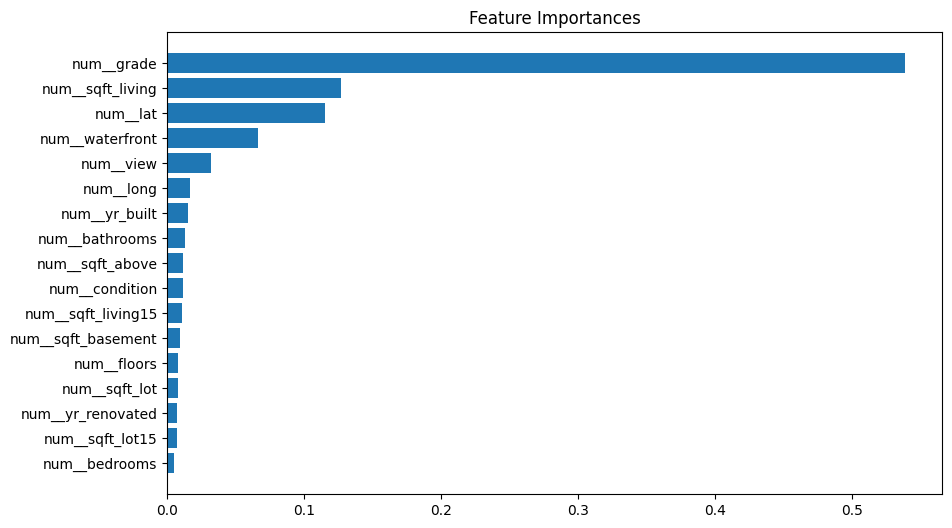

In [78]:
best_model = search.best_estimator_.named_steps['model']
importances = best_model.feature_importances_
feature_names = search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

indices = np.argsort(importances)[::-1][:20]  # أهم 20 خاصية
plt.figure(figsize=(10,6))
plt.title("Feature Importances")
plt.barh(np.array(feature_names)[indices], importances[indices])
plt.gca().invert_yaxis()
plt.show()

In [79]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

df = pd.read_csv(r'C:\Users\hadee\Desktop\Data Scientist\Project_Final\kc_house_data.csv')

df['date'] = pd.to_datetime(df['date'], format='%Y%m%dT%H%M%S')
df.drop(['id', 'zipcode'], axis=1, inplace=True)
df['price'] = np.log(df['price'])

X = df.drop('price', axis=1)
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='mean')), ('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='constant', fill_value='missing')), ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

xgb_model = XGBRegressor(random_state=42)
rf_model = RandomForestRegressor(random_state=42)

stacking_model = StackingRegressor(
    estimators=[('xgb', xgb_model), ('rf', rf_model)],
    final_estimator=LinearRegression()
)

stacking_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('stacking', stacking_model)])

stacking_pipeline.fit(X_train, y_train)

y_pred = stacking_pipeline.predict(X_test)

print(f"R2 Score: {r2_score(y_test, y_pred)}")
print(f"Mean Absolute Error (MAE): {mean_absolute_error(y_test, y_pred)}")
print(f"Mean Squared Error (MSE): {mean_squared_error(y_test, y_pred)}")

R2 Score: 0.9017920022251054
Mean Absolute Error (MAE): 0.11911475938308254
Mean Squared Error (MSE): 0.027992425702065706


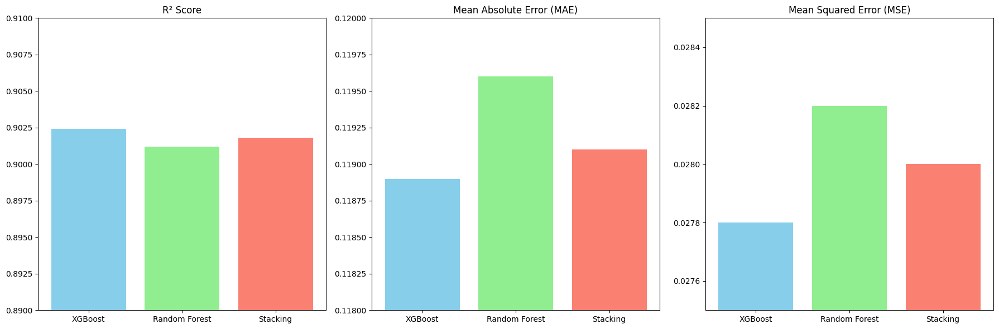

In [80]:
models = ['XGBoost', 'Random Forest', 'Stacking']
r2_scores = [0.9024, 0.9012, 0.9018]
mae_scores = [0.1189, 0.1196, 0.1191]
mse_scores = [0.0278, 0.0282, 0.0280]

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].bar(models, r2_scores, color=['skyblue', 'lightgreen', 'salmon'])
ax[0].set_title('R² Score')
ax[0].set_ylim(0.89, 0.91)

ax[1].bar(models, mae_scores, color=['skyblue', 'lightgreen', 'salmon'])
ax[1].set_title('Mean Absolute Error (MAE)')
ax[1].set_ylim(0.118, 0.120)

ax[2].bar(models, mse_scores, color=['skyblue', 'lightgreen', 'salmon'])
ax[2].set_title('Mean Squared Error (MSE)')
ax[2].set_ylim(0.0275, 0.0285)

plt.tight_layout()
plt.show()


#### Cross Validation Scores Comparison

In [81]:
from sklearn.model_selection import cross_val_score

X_train_cleaned = X_train.drop(['date'], axis=1, errors='ignore')  # إذا كانت تحتوي على العمود 'date' سابقاً
X_test_cleaned = X_test.drop(['date'], axis=1, errors='ignore')

models = {
    'Linear Regression': lin_reg,
    'Decision Tree': r_dt,
    'Random Forest': random_search_rf.best_estimator_,
    'XGBoost': search.best_estimator_
}

for name, model in models.items():
    scores = cross_val_score(model, X_train_cleaned, y_train, cv=5, scoring='r2')
    print(f"{name} CV R²: {scores.mean():.4f} (+/- {scores.std():.4f})")

Linear Regression CV R²: 0.7668 (+/- 0.0053)
Decision Tree CV R²: 0.7668 (+/- 0.0049)
Random Forest CV R²: 0.8834 (+/- 0.0025)
XGBoost CV R²: 0.8981 (+/- 0.0030)


<div style="background-color:#FC0000; padding:0px; border-radius:10px">
    <h1 style="color:#FFFFFF; text-align:center; font-family:Comic Sans MS, cursive, sans-serif; font-size:36px;">
       Model pipeline For Deployment 
    </h1>
</div>

In [ ]:
# Import Required Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from xgboost import XGBRegressor
import joblib

# Load and Preprocess Data
df = pd.read_csv("kc_house_data.csv")

# Drop unnecessary columns
df.drop(['id', 'zipcode', 'date'], axis=1, inplace=True)

# Apply log transformation to 'price' column
df['price'] = np.log(df['price'])  

# Define features and target
X = df.drop('price', axis=1)
y = df['price']

# Split Data into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Preprocessing Pipelines for Numeric and Categorical Data
numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

# Model Pipeline including Preprocessing and XGBoost Model
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', XGBRegressor(random_state=42))
])

# Define Hyperparameter Grid for RandomizedSearchCV
param_dist = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [10, 20, 30],
    'model__learning_rate': [0.01, 0.1, 0.3],
    'model__subsample': [0.8, 0.9, 1.0],
    'model__colsample_bytree': [0.8, 0.9, 1.0],
    'model__min_child_weight': [1, 5, 10]
}

# Perform RandomizedSearchCV for Hyperparameter Tuning
search = RandomizedSearchCV(model_pipeline, param_distributions=param_dist, n_iter=50, cv=5, random_state=42, n_jobs=-1)
search.fit(X_train, y_train)

# Display Best Parameters and Evaluation Metrics
print(f"Best Parameters: {search.best_params_}")

y_pred = search.predict(X_test)
print(f"R2 Score: {r2_score(y_test, y_pred)}")
print(f"Mean Absolute Error (MAE): {mean_absolute_error(y_test, y_pred)}")
print(f"Mean Squared Error (MSE): {mean_squared_error(y_test, y_pred)}")

# Save Model Pipeline for Deployment
model_save_path = 'C:/Users/hadee/Desktop/Data Scientist/Project_Final/model_pipeline.pkl'  
joblib.dump(search.best_estimator_, model_save_path)

# Example: Load Model Later and Predict
loaded_model = joblib.load('model_pipeline.pkl')
new_preds = loaded_model.predict(X_test)
print(f"Loaded Model R2 Score: {r2_score(y_test, new_preds)}")

Best Parameters: {'model__subsample': 1.0, 'model__n_estimators': 100, 'model__min_child_weight': 10, 'model__max_depth': 10, 'model__learning_rate': 0.1, 'model__colsample_bytree': 0.8}
R2 Score: 0.9030284718772321
Mean Absolute Error (MAE): 0.11817290707910864
Mean Squared Error (MSE): 0.0276399922378447
Loaded Model R2 Score: 0.9030284718772321


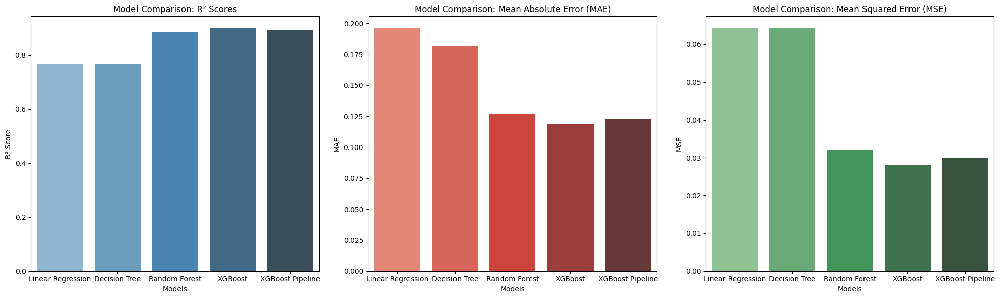

In [ ]:
models = {
    'Linear Regression': lin_reg,
    'Decision Tree': r_dt,
    'Random Forest': random_search_rf.best_estimator_,
    'XGBoost': search.best_estimator_,
    'XGBoost Pipeline': model_pipeline  
}

metrics = {
    'Model': [],
    'R² Score': [],
    'Mean Absolute Error': [],
    'Mean Squared Error': []
}

for name, model in models.items():
    
    y_pred = cross_val_predict(model, X_train_cleaned, y_train, cv=5)
    
    r2 = r2_score(y_train, y_pred)
    mae = mean_absolute_error(y_train, y_pred)
    mse = mean_squared_error(y_train, y_pred)
    
    metrics['Model'].append(name)
    metrics['R² Score'].append(r2)
    metrics['Mean Absolute Error'].append(mae)
    metrics['Mean Squared Error'].append(mse)

results = pd.DataFrame(metrics)

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# رسم R² Score
sns.barplot(x='Model', y='R² Score', hue='Model', data=results, palette="Blues_d", ax=axes[0], legend=False)
axes[0].set_title('Model Comparison: R² Scores')
axes[0].set_xlabel('Models')
axes[0].set_ylabel('R² Score')

# رسم MAE
sns.barplot(x='Model', y='Mean Absolute Error', hue='Model', data=results, palette="Reds_d", ax=axes[1], legend=False)
axes[1].set_title('Model Comparison: Mean Absolute Error (MAE)')
axes[1].set_xlabel('Models')
axes[1].set_ylabel('MAE')

# رسم MSE
sns.barplot(x='Model', y='Mean Squared Error', hue='Model', data=results, palette="Greens_d", ax=axes[2], legend=False)
axes[2].set_title('Model Comparison: Mean Squared Error (MSE)')
axes[2].set_xlabel('Models')
axes[2].set_ylabel('MSE')

plt.tight_layout()
plt.show()


In [ ]:
## streamlit run app2.py